# 🍇 Projet Deep Learning   
## Détection automatisée des maladies de la vigne

Ce notebook utilise le [Grapevine Disease Dataset](https://www.kaggle.com/datasets/rm1000/grape-disease-dataset-original), contenant **9027 images de feuilles de vigne** réparties en quatre classes :  
- **Black Rot**  
- **ESCA**  
- **Leaf Blight**  
- **Healthy**

L’objectif est de concevoir un modèle de **classification d'images** reposant sur des réseaux de neurones convolutifs (**CNN**) pour identifier visuellement les maladies affectant les plants de vigne.

Ce projet illustre une application concrète du **deep learning** dans le domaine de l’agriculture de précision. Une telle approche permettrait une **détection rapide et fiable** des pathologies, contribuant ainsi à une meilleure gestion des cultures viticoles.

---
👨‍💻 **Technologies clés :**  
- Python  
- TensorFlow  
- CNN & Transfer Learning + Fine tuning 
- Visualisation et évaluation des performances du modèle

In [33]:
#  Suppression des logs et warnings TensorFlow
import os, logging, warnings

# Ne conserver que les erreurs critiques (FATAL)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Optionnel : masquer les warnings Python (deprecation, clipping, etc.)
warnings.filterwarnings('ignore')


### Preparation des données & Hyperparamètres d’entraînement

In [34]:
from tensorflow import keras
from tensorflow.keras import layers

#  Paramètres du modèle
BATCH_SIZE     = 32        # Nombre d'images traitées en même temps
IMG_SIZE       = 224       # Taille d'entrée pour EfficientNetB0 (224×224)
EPOCHS         = 20        # Nombre total d'époques
LEARNING_RATE  = 1e-4      # Taux d'apprentissage initial

print(" Configuration d'entraînement:")
print(f"   • Taille de batch: {BATCH_SIZE}")
print(f"   • Taille d'image: {IMG_SIZE}*{IMG_SIZE} pixels")
print(f"   • Nombre d'époques: {EPOCHS}")
print(f"   • Taux d'apprentissage: {LEARNING_RATE}")

#  Redéfinition du bloc d'augmentation pour accepter (None,224,224,3)
data_augmentation = keras.Sequential([
    layers.InputLayer(input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.1),
], name="data_augmentation")


 Configuration d'entraînement:
   • Taille de batch: 32
   • Taille d'image: 224*224 pixels
   • Nombre d'époques: 20
   • Taux d'apprentissage: 0.0001


### Test de la disponibilité GPU

In [35]:
import tensorflow as tf

# Configuration GPU pour éviter les erreurs OOM (Out of Memory)
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    try:
        # Limiter la croissance de la mémoire GPU
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print(" Configuration GPU réussie - Croissance mémoire activée")
    except RuntimeError as e:
        print(f" Erreur configuration GPU: {e}")
else:
    print(" Utilisation du CPU - Pas de GPU détecté")


 Utilisation du CPU - Pas de GPU détecté


#### Chargement du dataset et comparaison d'images au niveau des pixels = train vs train, test vs test, et train vs test

In [36]:
import os
import hashlib
import numpy as np
from PIL import Image

#  Chargement des datasets depuis vos répertoires
train_dir = './Grapevine Disease Dataset Original Data/train'
test_dir  = './Grapevine Disease Dataset Original Data/test'

def get_all_image_paths(directory):
    """
Recherche les doublons d'images dans un dossier donn.
Parcourt récursivement tous les fichiers images dans le dossier spécifié,
calcule le hash md5 basé sur le contenu des pixels de chaque image, 
et détecte les fichiers identiques (doublons.
Args:
    directory (str): Chemin du dossier à analyse.
Returns:
    list of tuple: Liste de paires de chemins de fichiers considérés comme doublons.
    """
    image_paths = []
    for root, _, files in os.walk(directory):
        for f in files:
            if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                image_paths.append(os.path.join(root, f))
    return image_paths

def hash_image(image_path):
    """
    Calcule le hash md5 d'une image basé sur son contenu de pixels.
    Args:
        image_path (str): Chemin de l'image à hasher.
    Returns:
        str: Hash md5 de l'image.
    """
    img = Image.open(image_path).convert('RGB')
    arr = np.array(img)
    arr_bytes = arr.tobytes()
    return hashlib.md5(arr_bytes).hexdigest()

def build_hash_dict(image_paths):
    """
    Génère un dictionnaire {hash: [chemins]} pour toutes les images.
    Args:
        image_paths (list of str): Liste des chemins d'images.
    Returns:
        dict: Dictionnaire des hash md5 vers une liste de fichiers ayant ce hash.
    """
    hash_dict = {}
    for path in image_paths:
        try:
            h = hash_image(path)
            if h in hash_dict:
                hash_dict[h].append(path)
            else:
                hash_dict[h] = [path]
        except Exception as e:
            print(f"Erreur avec {path}: {e}")
    return hash_dict

# 1. Lister toutes les images
train_images = get_all_image_paths(train_dir)
test_images = get_all_image_paths(test_dir)

# 2. Générer les hash pour chaque set
train_hashes = build_hash_dict(train_images)
test_hashes  = build_hash_dict(test_images)

# 3. Chercher les doublons dans chaque set (interne)
def extract_duplicates(hash_dict):
    """
    Extrait toutes les paires de fichiers images identiques (doublons internes).

    Args:
        hash_dict (dict): Dictionnaire {hash: [liste de chemins de fichiers]}.

    Returns:
        list of tuple: Liste des paires de fichiers considérés comme doublons.
    """
    return [(v[0], v[1]) for v in hash_dict.values() if len(v) > 1]

train_dupes = extract_duplicates(train_hashes)
test_dupes  = extract_duplicates(test_hashes)

# 4. Doublons entre train et test (cross-set)
cross_dupes = []
for h in train_hashes:
    if h in test_hashes:
        # Toutes les combinaisons train vs test pour ce hash
        for p1 in train_hashes[h]:
            for p2 in test_hashes[h]:
                cross_dupes.append((p1, p2))

# 5. Affichage des résultats
print(f"Nombre de doublons dans le train : {len(train_dupes)}")
for d1, d2 in train_dupes:
    print(f"[Train] Doublon trouvé : {d1} <--> {d2}")

print(f"\nNombre de doublons dans le test : {len(test_dupes)}")
for d1, d2 in test_dupes:
    print(f"[Test] Doublon trouvé : {d1} <--> {d2}")

print(f"\nNombre de doublons entre train et test : {len(cross_dupes)}")
for d1, d2 in cross_dupes:
    print(f"[Cross-set] Doublon trouvé : {d1} <--> {d2}")

# 6. Bloc suppression automatique (optionnel) - A UTILISER AVEC PRÉCAUTION !!
def delete_duplicates(dupe_pairs):
    for f1, f2 in dupe_pairs:
        # On supprime le 2e fichier (mais tu peux changer la logique)
        try:
            os.remove(f2)
            print(f"Supprimé : {f2}")
        except Exception as e:
            print(f"Erreur suppression {f2} : {e}")

# Pour supprimer les doublons, décommenter une des lignes ci-dessous :
# delete_duplicates(train_dupes)
# delete_duplicates(test_dupes)
# delete_duplicates(cross_dupes)


Nombre de doublons dans le train : 0

Nombre de doublons dans le test : 0

Nombre de doublons entre train et test : 0


#### Chargement du datset

In [37]:
import os
import tensorflow as tf

#  Chargement des datasets depuis répertoires
train_dir = './Grapevine Disease Dataset Original Data/train'
test_dir  = './Grapevine Disease Dataset Original Data/test'

print(" Chargement du Grapevine Disease Dataset...")

raw_train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='categorical',    # on récupère un vecteur one-hot
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=1,
    shuffle=True
)

raw_val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=1,
    shuffle=False
)

class_names = raw_train_ds.class_names
num_classes = len(class_names)

print(f" Dataset chargé !")
print(f" Nombre de classes: {num_classes}")
print(f" Noms des classes: {class_names}")

# On "déplie" pour n'avoir qu'un échantillon par élément du dataset
ds_train = raw_train_ds.unbatch()
ds_val   = raw_val_ds.unbatch()


 Chargement du Grapevine Disease Dataset...
Found 7222 files belonging to 4 classes.
Found 1805 files belonging to 4 classes.
 Dataset chargé !
 Nombre de classes: 4
 Noms des classes: ['Black Rot', 'ESCA', 'Healthy', 'Leaf Blight']


#### Répartition et aperçu d’un exemple

In [38]:

#  Compter les échantillons
train_size = sum(1 for _ in ds_train)
val_size   = sum(1 for _ in ds_val)

print(" Répartition des données:")
print(f"    Entraînement: {train_size} images ({train_size/(train_size+val_size)*100:.1f} %)")
print(f"    Validation: {val_size} images ({val_size/(train_size+val_size)*100:.1f} %)")
print(f"    Total: {train_size + val_size} images")

# Examiner une image d'exemple
print("\n Exemple d'image du dataset:")
for image, label in ds_train.take(1):
    print(f"    Forme de l'image: {image.shape}")
    print(f"    Type de données: {image.dtype}")
    lab_idx = tf.argmax(label).numpy()
    print(f"    Label: {lab_idx} ({class_names[lab_idx]})")
    print(f"    Valeurs pixel min/max: {tf.reduce_min(image).numpy()}/{tf.reduce_max(image).numpy()}")


 Répartition des données:
    Entraînement: 7222 images (80.0 %)
    Validation: 1805 images (20.0 %)
    Total: 9027 images

 Exemple d'image du dataset:
    Forme de l'image: (224, 224, 3)
    Type de données: <dtype: 'float32'>
    Label: 3 (Leaf Blight)
    Valeurs pixel min/max: 0.0/221.97952270507812


#### Fonction de préprocessing pour EfficientNetB0

In [39]:

#  Fonction de préprocessing
def preprocess_image(image, label):
    """
    Préprocesse une image pour EfficientNetB0
    Args:
        image: Tensor d'image (hauteur, largeur, 3)
        label: Vecteur one-hot    
    Returns:
        (image_proc, label)
    """
    #  Redimensionnement
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    
    #  Préprocessing spécifique à EfficientNet
    image = tf.keras.applications.efficientnet.preprocess_input(image)
    
    return image, label

print(" Fonction de préprocessing définie")
print("    Redimensionnement → 224x224")
print("    Normalisation par EfficientNet.preprocess_input")


 Fonction de préprocessing définie
    Redimensionnement → 224x224
    Normalisation par EfficientNet.preprocess_input


#### Pipeline d’augmentation via tf.data

In [40]:
#  Augmentation de données “on the fly”
def augment_image(image, label):
    image = data_augmentation(image, training=True)
    return image, label

print(" Augmentation de données configurée:")
print("   ↔ Retournement horizontal aléatoire")
print("    Rotation aléatoire (±20 %)")
print("    Zoom aléatoire (±10 %)")
print("\n Pourquoi augmenter ?")
print("   • Enrichit le dataset")
print("   • Améliore la généralisation")
print("   • Réduit l’overfitting")


 Augmentation de données configurée:
   ↔ Retournement horizontal aléatoire
    Rotation aléatoire (±20 %)
    Zoom aléatoire (±10 %)

 Pourquoi augmenter ?
   • Enrichit le dataset
   • Améliore la généralisation
   • Réduit l’overfitting


In [41]:
def augment_image(image, label):
    """
    Applique le bloc data_augmentation sur un tenseur 3D,
    en passant temporairement par une dimension batch.
    """
    # 1. Passage à (1, H, W, 3)
    img_batch = tf.expand_dims(image, axis=0)
    # 2. Augmentation « on the fly »
    img_batch = data_augmentation(img_batch, training=True)
    # 3. Retour à (H, W, 3)
    img_aug = tf.squeeze(img_batch, axis=0)
    return img_aug, label


#### Construction du pipeline tf.data

In [42]:
#  Optimisation des performances avec prefetch et parallelisme
AUTOTUNE = tf.data.AUTOTUNE

print("=== Application du pipeline de préparation des données...\n")

#  Pipeline d'entraînement : preprocess → augment → batch → prefetch
ds_train_processed = (
    ds_train
    .map(preprocess_image, num_parallel_calls=AUTOTUNE)
    .map(augment_image,    num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)
print(" === Pipeline d'entraînement prêt")

#  Pipeline de validation : preprocess → batch → prefetch
ds_val_processed = (
    ds_val
    .map(preprocess_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)
print(" === Pipeline de validation prêt")


=== Application du pipeline de préparation des données...

 === Pipeline d'entraînement prêt
 === Pipeline de validation prêt


#### Visualisation d'un batch

 === Fonction de visualisation prête


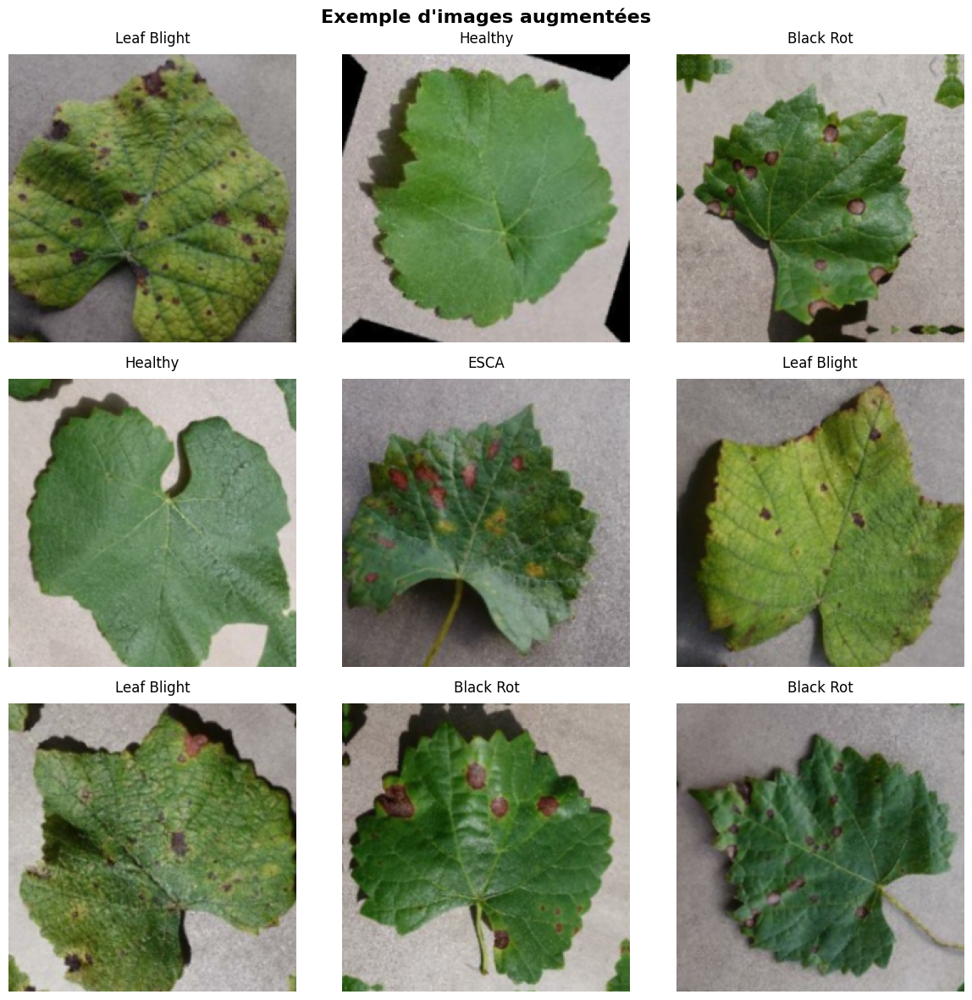

In [43]:
import matplotlib.pyplot as plt

def show_batch(dataset, title="Batch d'images", num_images=9, figsize=(12,12)):
    plt.figure(figsize=figsize)
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    for images, labels in dataset.take(1):
        for i in range(min(num_images, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            img = images[i].numpy()
            
            # Si l’image est dans [-1, 1], la ramener à [0, 1]
            if img.min() < 0:
                img = (img + 1) / 2
            # Si >1, normaliser sur 255
            if img.max() > 1:
                img = img / 255.0
            
            plt.imshow(img)
            lbl_idx = tf.argmax(labels[i]).numpy()
            plt.title(class_names[lbl_idx], fontsize=12, pad=10)
            plt.axis('off')
    plt.tight_layout()
    plt.show()

print(" === Fonction de visualisation prête")
# Exemple d'affichage
show_batch(ds_train_processed, title="Exemple d'images augmentées")


#### Images après préprocessing

=== Aperçu après préprocessing (redimensionnement + normalisation) :


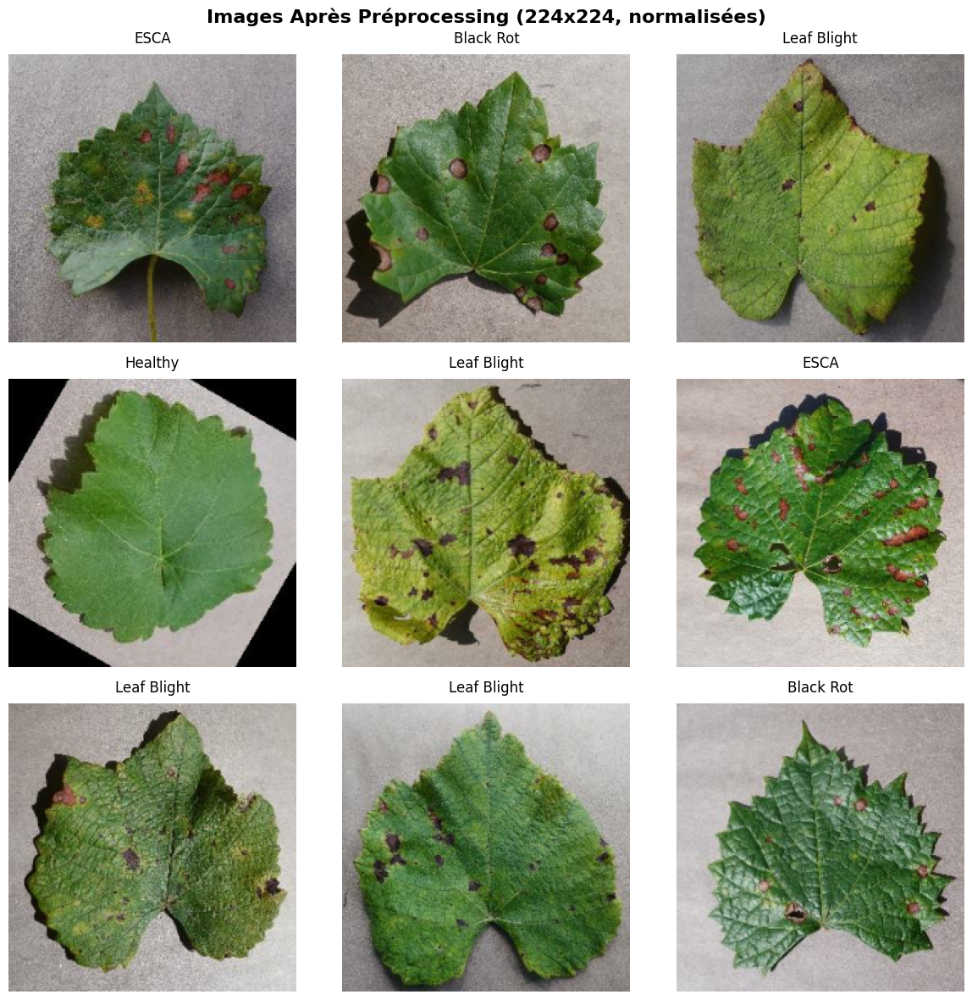

In [44]:
#  Affichage après préprocessing (sans augmentation)
# On reprend ds_train non-batché, on applique preprocess_image, puis on batch par 9
ds_preprocessed_only = ds_train.map(preprocess_image).batch(9)

print("=== Aperçu après préprocessing (redimensionnement + normalisation) :")
show_batch(
    ds_preprocessed_only,
    title="Images Après Préprocessing (224x224, normalisées)"
)


#### Démonstration de l’augmentation de données

 Démonstration de l'augmentation de données :


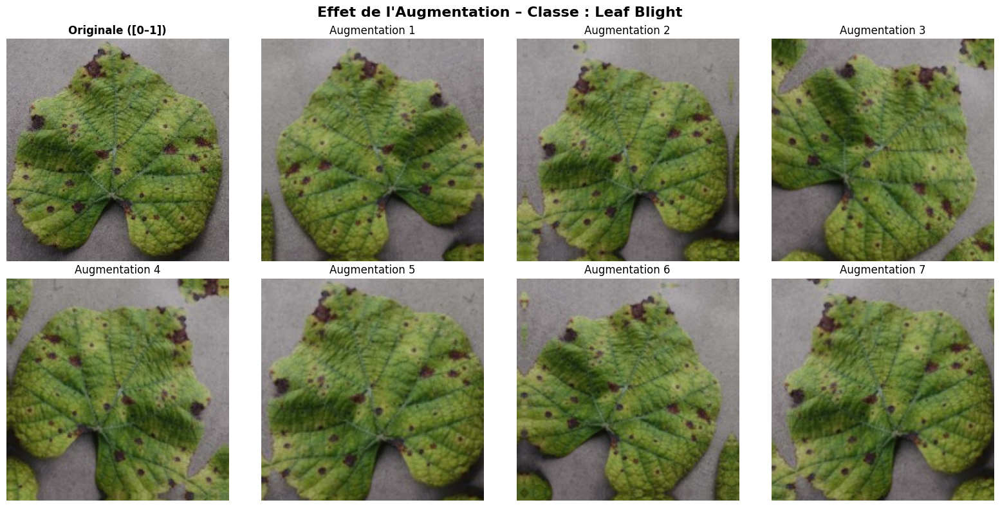


 Observations sur l'augmentation :
    Chaque version est unique et reste dans [0,1]
    L'augmentation enrichit le dataset sans écraser les originaux
    Le modèle devient plus resistant aux variations visuelles


In [45]:
import matplotlib.pyplot as plt
import tensorflow as tf

def show_augmentation_effect():
    """
    Montre l'effet de l'augmentation sur une même image non-batchée,
    en partant d'une image redimensionnée et mise à l'échelle [0,1].
    """
    for original_image, label in ds_train.take(1):
        # 1. Redimensionnement + mise à l'échelle [0,1]
        img_resized = tf.image.resize(original_image, (IMG_SIZE, IMG_SIZE))
        img_norm    = img_resized / 255.0            # (224,224,3)

        # 2. Récupération de l'indice de classe
        label_idx = tf.argmax(label).numpy()

        # 3. Préparation du canevas
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle(
            f"Effet de l'Augmentation – Classe : {class_names[label_idx]}",
            fontsize=16, fontweight='bold'
        )

        # 4. Afficher l'originale
        axes[0, 0].imshow(img_norm.numpy())
        axes[0, 0].set_title("Originale ([0–1])", fontweight='bold')
        axes[0, 0].axis('off')

        # 5. Générer et afficher 7 augmentations
        for i in range(1, 8):
            # a. Ajouter une dimension batch → (1,224,224,3)
            img_batch = tf.expand_dims(img_norm, axis=0)
            # b. Appliquer data_augmentation → (1,224,224,3)
            aug_batch = data_augmentation(img_batch, training=True)
            # c. Retirer la dimension batch → (224,224,3)
            aug_img   = tf.squeeze(aug_batch, axis=0)

            row, col = divmod(i, 4)
            axes[row, col].imshow(aug_img.numpy())
            axes[row, col].set_title(f"Augmentation {i}")
            axes[row, col].axis('off')

        plt.tight_layout()
        plt.show()
        break

print(" Démonstration de l'augmentation de données :")
show_augmentation_effect()

print("\n Observations sur l'augmentation :")
print("    Chaque version est unique et reste dans [0,1]")
print("    L'augmentation enrichit le dataset sans écraser les originaux")
print("    Le modèle devient plus resistant aux variations visuelles")


#### Aperçu final du dataset d’entraînement

 Aperçu final du dataset d'entraînement (préprocessé + augmenté) :


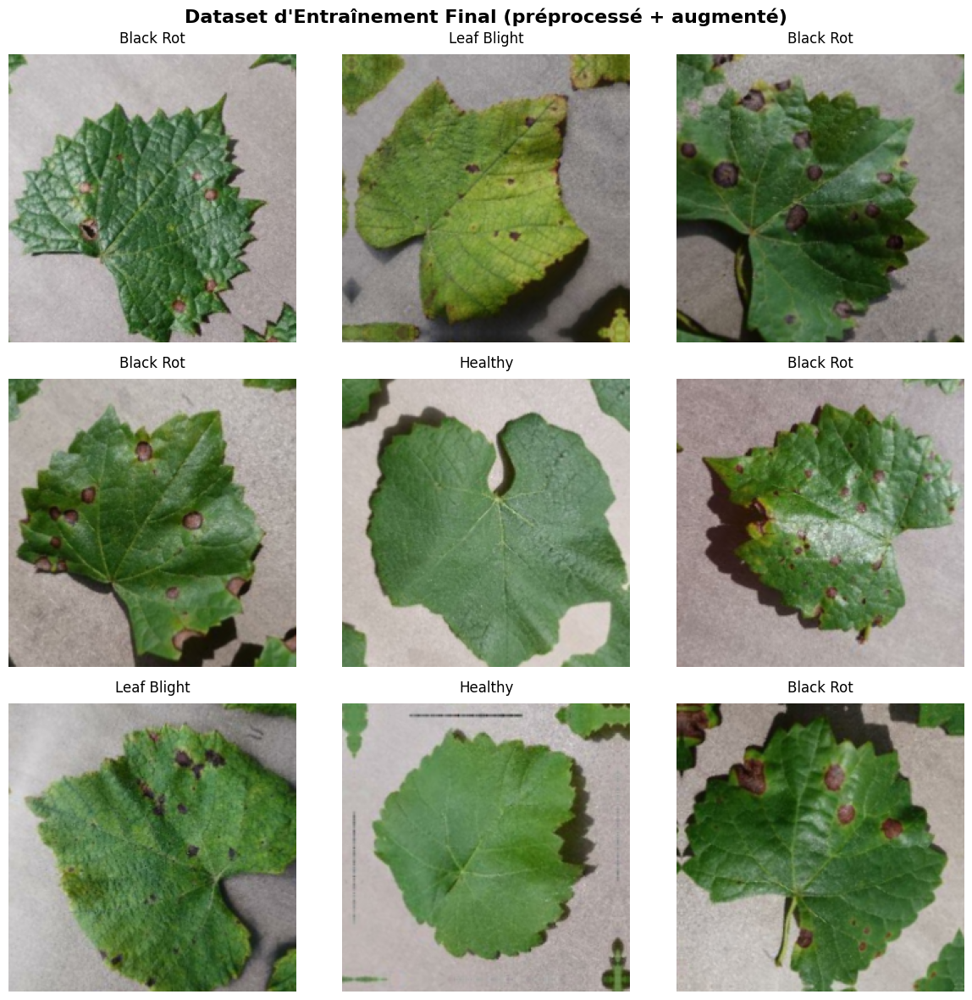


 Résumé de ce que le modèle va recevoir :
    Taille : 224x224x3 pixels
    Valeurs : [-1, 1] (normalisées pour EfficientNetB0)
    Variété : augmentations aléatoires à chaque époque
    Batch : 32 images à la fois


In [46]:
print(" Aperçu final du dataset d'entraînement (préprocessé + augmenté) :")
show_batch(
    ds_train_processed,
    title="Dataset d'Entraînement Final (préprocessé + augmenté)"
)

print("\n Résumé de ce que le modèle va recevoir :")
print("    Taille : 224x224x3 pixels")
print("    Valeurs : [-1, 1] (normalisées pour EfficientNetB0)")
print("    Variété : augmentations aléatoires à chaque époque")
print("    Batch : 32 images à la fois")


#### Chargement de EfficientNetB0

In [47]:
#  Chargement du modèle de base EfficientNetB0
import tensorflow as tf

print(" Chargement d'EfficientNetB0 pré-entraîné...")

base_model = tf.keras.applications.EfficientNetB0(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),  # Forme d'entrée
    include_top=False,                    # Exclure la tête de classification ImageNet
    weights='imagenet'                    # Poids pré-entraînés
)

#  Geler les couches du modèle de base (transfer learning)
base_model.trainable = False

print(" EfficientNetB0 chargé avec succès !")
print(f" Nombre de couches : {len(base_model.layers)}")
print(f" Forme de sortie : {base_model.output_shape}")
print(f" Couches gelées : {not base_model.trainable}")

#  Explication 
print("\n Pourquoi geler les couches ?")
print("   • Les features bas-niveau (bords, textures) sont déjà apprises")
print("   • On préserve les représentations pré-entraînées d’ImageNet")
print("   • L'entraînement initial est plus rapide et stable")
print("   • On dégèlera progressivement certaines couches en fine-tuning")


 Chargement d'EfficientNetB0 pré-entraîné...
 EfficientNetB0 chargé avec succès !
 Nombre de couches : 238
 Forme de sortie : (None, 7, 7, 1280)
 Couches gelées : True

 Pourquoi geler les couches ?
   • Les features bas-niveau (bords, textures) sont déjà apprises
   • On préserve les représentations pré-entraînées d’ImageNet
   • L'entraînement initial est plus rapide et stable
   • On dégèlera progressivement certaines couches en fine-tuning


#### Architecture du modèle

In [48]:
import tensorflow as tf
from tensorflow.keras import layers, models

#  Construction du modèle complet avec EfficientNetB0
print(" Construction de l'architecture complète avec EfficientNetB0...")

# 1. Couche d'entrée
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# 2. Augmentation “on the fly” (maintenant accepte 4-D)
x = data_augmentation(inputs)

# 3. Passage dans la base EfficientNetB0 (gelée)
x = base_model(x, training=False)

# 4. Pooling global
x = layers.GlobalAveragePooling2D()(x)

# 5. Dropout pour la régularisation
x = layers.Dropout(0.2)(x)

# 6. Tête de classification
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 7. Création du modèle final
model = models.Model(inputs, outputs)

print(" Modèle créé avec succès !")

# 8. Comptage des paramètres
total_params       = model.count_params()
trainable_params   = sum(tf.size(w).numpy() for w in model.trainable_weights)
non_trainable_params = sum(tf.size(w).numpy() for w in model.non_trainable_weights)

print(f" Nombre total de paramètres    : {total_params:,}")
print(f" Paramètres entraînables       : {trainable_params:,}")
print(f" Paramètres non entraînables   : {non_trainable_params:,}")


 Construction de l'architecture complète avec EfficientNetB0...
 Modèle créé avec succès !
 Nombre total de paramètres    : 4,054,695
 Paramètres entraînables       : 5,124
 Paramètres non entraînables   : 4,049,571


#### Résumé de l'Architecture

 Architecture du modèle :


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         5,124 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

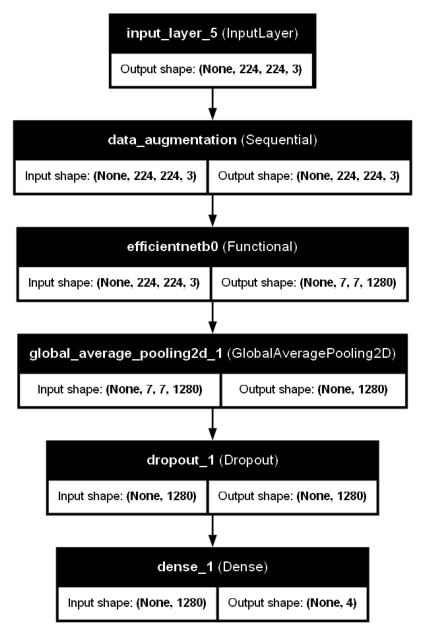

In [49]:
#  Affichage textuel et graphique de l'architecture du modèle

# 1️ Résumé texte
print(" Architecture du modèle :")
model.summary()

# 2️ Vue graphique (nécessite pydot + graphviz installés)
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
from IPython.display import Image

# Génère le schéma et l’enregistre
plot_model(
    model,
    to_file='model_architecture.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=96
)

# Affiche l’image directement dans le notebook
plt.figure(figsize=(8, 8))
img = plt.imread('model_architecture.png')
plt.axis('off')
plt.imshow(img)
plt.show()


#### Couches gelées

In [50]:
#  Configuration de l'entraînement Phase 1 (Transfer Learning — couches gelées)
print(" === PHASE 1 : TRANSFER LEARNING (couches gelées) ===")
print("\n Configuration de l'optimiseur et des métriques...")

# Compilation du modèle
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',    # Pour vecteurs one-hot
    metrics=['accuracy']
)

print(" Modèle compilé !")
print(f"    Optimiseur   : Adam (lr={LEARNING_RATE})")
print(f"    Fonction de perte : Categorical Crossentropy")
print(f"    Métrique     : Accuracy")

#  Explication 
print("\n Pourquoi ces choix ?")
print("   • Adam : Optimiseur adaptatif, stable et rapide à converger")
print("   • Categorical Crossentropy : adapté aux labels one-hot")
print("   • Learning rate faible : ne pas dégrader les représentations pré-entraînées")


 === PHASE 1 : TRANSFER LEARNING (couches gelées) ===

 Configuration de l'optimiseur et des métriques...
 Modèle compilé !
    Optimiseur   : Adam (lr=0.0001)
    Fonction de perte : Categorical Crossentropy
    Métrique     : Accuracy

 Pourquoi ces choix ?
   • Adam : Optimiseur adaptatif, stable et rapide à converger
   • Categorical Crossentropy : adapté aux labels one-hot
   • Learning rate faible : ne pas dégrader les représentations pré-entraînées


#### Callbacks

In [54]:
#  Configuration des callbacks pour le fine-tuning
from tensorflow.keras import callbacks 

save_dir = "../Models"
os.makedirs(save_dir, exist_ok=True)
chemin_sauvegarde = os.path.join(save_dir, "DL_WINE_06_TL_FT.keras")

callbacks = [
    # Réduction du learning rate si la perte de validation stagne
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',    # Surveiller la loss de validation
        factor=0.2,            # Diviser le LR par 5 (×0.2)
        patience=3,            # Après 3 époques sans amélioration
        min_lr=1e-7,           # Ne jamais descendre en dessous de 1e-7
        verbose=1
    ),
    # Arrêt anticipé si la validation ne s'améliore plus
    callbacks.EarlyStopping(
        monitor='val_loss',    # Même critère
        patience=5,            # Un peu plus de patience (5 époques)
        restore_best_weights=True,
        verbose=1
    ),
    callbacks.ModelCheckpoint(
        filepath=chemin_sauvegarde, 
        monitor='val_accuracy', 
        save_best_only=True, 
        verbose=2
    )
]

print(" Callbacks configurés :")
print("    ReduceLROnPlateau  – réduit automatiquement le learning rate")
print("    EarlyStopping      – arrête l'entraînement si pas d'amélioration")
print("    ModelCheckpoint    - sauvegarde de meilleur modele")
print("\n Avantages des callbacks :")
print("   • Évitent le surapprentissage")
print("   • Économisent du temps de calcul")
print("   • Ajustent dynamiquement l'entraînement")


 Callbacks configurés :
    ReduceLROnPlateau  – réduit automatiquement le learning rate
    EarlyStopping      – arrête l'entraînement si pas d'amélioration
    ModelCheckpoint    - sauvegarde de meilleur modele

 Avantages des callbacks :
   • Évitent le surapprentissage
   • Économisent du temps de calcul
   • Ajustent dynamiquement l'entraînement


#### Phase 1 entrainement 

In [55]:
#  Phase 1 : Transfer Learning (tête seule)
#  On définit initial_epochs si ce n'est déjà fait
import time

initial_epochs = EPOCHS // 2  # ex. 10 // 2 = 5

print(" Début de l'entraînement Phase 1 (tête seule)…")

#  Calcul des batches à partir de train_size / val_size
train_batches = train_size // BATCH_SIZE + int(train_size % BATCH_SIZE != 0)
val_batches   = val_size   // BATCH_SIZE + int(val_size   % BATCH_SIZE != 0)
print(f" {train_batches} batches d'entraînement ({train_size} images)")
print(f" {val_batches} batches de validation ({val_size} images)")
print("\n⏰ Cela peut prendre quelques minutes…\n")

# mesure du temps
start_time = time.time()

#  Lancement de l'entraînement
history_initial = model.fit(
    ds_train_processed,
    epochs=initial_epochs,        # p. ex. 5 si EPOCHS=10
    validation_data=ds_val_processed,
    callbacks=callbacks,
    verbose=1
)
end_time = time.time()
dure = end_time - start_time
minutes,secondes = divmod(end_time - start_time,60)
print (f"Durée totale de l'entraînement Phase 1 : {int(minutes)} min {secondes:.2f} s")

#  Récapitulatif
print("\n Phase 1 terminée !")
print(f" Époques effectuées           : {len(history_initial.history['accuracy'])}")
print(f" Précision finale training    : {history_initial.history['accuracy'][-1]:.4f}")
print(f" Précision finale validation  : {history_initial.history['val_accuracy'][-1]:.4f}")


 Début de l'entraînement Phase 1 (tête seule)…
 226 batches d'entraînement (7222 images)
 57 batches de validation (1805 images)

⏰ Cela peut prendre quelques minutes…

Epoch 1/10
    226/Unknown 33s 131ms/step - accuracy: 0.4480 - loss: 1.2343
Epoch 1: val_accuracy improved from -inf to 0.83546, saving model to ../Models\DL_WINE_06_TL_FT.keras
226/226 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - accuracy: 0.4487 - loss: 1.2335 - val_accuracy: 0.8355 - val_loss: 0.7332 - learning_rate: 1.0000e-04
Epoch 2/10
226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 0.8468 - loss: 0.7031
Epoch 2: val_accuracy improved from 0.83546 to 0.90249, saving model to ../Models\DL_WINE_06_TL_FT.keras
226/226 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - accuracy: 0.8468 - loss: 0.7029 - val_accuracy: 0.9025 - val_loss: 0.4934 - learning_rate: 1.0000e-04
Epoch 3/10
226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 0.8975 - loss: 0.4959
Epoch 3: val_accuracy improved from 0.90249 to 0.92798, saving model to ../M

#### Degel & fine tunning


In [56]:
#  Analyse des couches de EfficientNetB0
print(" Analyse des couches d'EfficientNetB0 :")
print(f" Nombre total de couches : {len(base_model.layers)}")

# Afficher les dernières 31 couches pour visualiser la structure
print("\n Structure des dernières 31 couches :")
for i, layer in enumerate(base_model.layers[-31:], start=len(base_model.layers)-31):
    print(f"   {i:3d}: {layer.name} ({layer.__class__.__name__})")

#  Stratégie de dégel : dégeler les 31 dernières couches
num_unfreeze  = 31
fine_tune_at  = len(base_model.layers) - num_unfreeze

print(f"\n Stratégie de dégel :")
print(f"    Couches 0 à {fine_tune_at-1}   : GELÉES (features génériques)")
print(f"    Couches {fine_tune_at} à {len(base_model.layers)-1}: DÉGELÉES (features spécifiques)")

# Application du dégel
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
for layer in base_model.layers[fine_tune_at:]:
    layer.trainable = True

print("\n Définition des états trainable/non-trainable terminée.")
print(f"   • Total layers : {len(base_model.layers)}")
print(f"   • Gelées       : {fine_tune_at}")
print(f"   • Dégelées     : {len(base_model.layers) - fine_tune_at}")


 Analyse des couches d'EfficientNetB0 :
 Nombre total de couches : 238

 Structure des dernières 31 couches :
   207: block6d_expand_conv (Conv2D)
   208: block6d_expand_bn (BatchNormalization)
   209: block6d_expand_activation (Activation)
   210: block6d_dwconv (DepthwiseConv2D)
   211: block6d_bn (BatchNormalization)
   212: block6d_activation (Activation)
   213: block6d_se_squeeze (GlobalAveragePooling2D)
   214: block6d_se_reshape (Reshape)
   215: block6d_se_reduce (Conv2D)
   216: block6d_se_expand (Conv2D)
   217: block6d_se_excite (Multiply)
   218: block6d_project_conv (Conv2D)
   219: block6d_project_bn (BatchNormalization)
   220: block6d_drop (Dropout)
   221: block6d_add (Add)
   222: block7a_expand_conv (Conv2D)
   223: block7a_expand_bn (BatchNormalization)
   224: block7a_expand_activation (Activation)
   225: block7a_dwconv (DepthwiseConv2D)
   226: block7a_bn (BatchNormalization)
   227: block7a_activation (Activation)
   228: block7a_se_squeeze (GlobalAveragePoolin

In [57]:
#  Re-compilation pour Phase 2 (Fine-Tuning partiel)
from tensorflow.keras import optimizers

# On réduit le learning rate par 10 pour ne pas trop perturber les poids pré-entraînés
fine_tune_lr = LEARNING_RATE / 10

print(" === PHASE 2 : FINE-TUNING (couches dégelées) ===")
print(f" Re-compilation avec lr = {fine_tune_lr:.1e}…")

model.compile(
    optimizer=optimizers.Adam(learning_rate=fine_tune_lr),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(" Modèle recompilé pour le fine-tuning !")
print(f"  • Optimiseur   : Adam (lr={fine_tune_lr:.1e})")
print("   • Loss         : Categorical Crossentropy")
print("   • Métrique     : Accuracy")

#  Lancement du fine-tuning
fine_tune_epochs = EPOCHS - initial_epochs
total_epochs     = initial_epochs + fine_tune_epochs

print(f"\n Démarrage du fine-tuning pour {fine_tune_epochs} époques supplémentaires…")
# mesure du temps
start_time = time.time()
history_finetune = model.fit(
    ds_train_processed,
    epochs=total_epochs,
    initial_epoch=initial_epochs,    # continuer après la phase 1
    validation_data=ds_val_processed,
    callbacks=callbacks,
    verbose=1
)
end_time = time.time()
dure = end_time - start_time
minutes,secondes = divmod(end_time - start_time,60)
print (f"Durée totale de l'entraînement Phase 2  : {int(minutes)} min {secondes:.2f} s")
print("\n Fine-tuning terminé !")
print(f" Total époques effectuées       : {len(history_finetune.history['accuracy'])}")
print(f" Précision finale entraînement : {history_finetune.history['accuracy'][-1]:.4f}")
print(f" Précision finale validation   : {history_finetune.history['val_accuracy'][-1]:.4f}")


 === PHASE 2 : FINE-TUNING (couches dégelées) ===
 Re-compilation avec lr = 1.0e-05…
 Modèle recompilé pour le fine-tuning !
  • Optimiseur   : Adam (lr=1.0e-05)
   • Loss         : Categorical Crossentropy
   • Métrique     : Accuracy

 Démarrage du fine-tuning pour 10 époques supplémentaires…
Epoch 11/20
    226/Unknown 41s 163ms/step - accuracy: 0.8290 - loss: 0.5604
Epoch 11: val_accuracy did not improve from 0.95956
226/226 ━━━━━━━━━━━━━━━━━━━━ 50s 201ms/step - accuracy: 0.8292 - loss: 0.5599 - val_accuracy: 0.9479 - val_loss: 0.1951 - learning_rate: 1.0000e-05
Epoch 12/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9291 - loss: 0.2825
Epoch 12: val_accuracy improved from 0.95956 to 0.97452, saving model to ../Models\DL_WINE_06_TL_FT.keras
226/226 ━━━━━━━━━━━━━━━━━━━━ 46s 205ms/step - accuracy: 0.9291 - loss: 0.2823 - val_accuracy: 0.9745 - val_loss: 0.1198 - learning_rate: 1.0000e-05
Epoch 13/20
226/226 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.9575 - loss: 0.

#### Visualisation des résultats de l'entrainement

In [58]:
import matplotlib.pyplot as plt

def plot_training_history(history1, history2=None, title="Évolution de l'Entraînement"):
    """
    Affiche les courbes d'entraînement pour les deux phases sans modifier
    les historiques originaux.
    """
    # 1. On récupère et on copie les listes d'origine
    acc1      = history1.history['accuracy'].copy()
    val_acc1  = history1.history['val_accuracy'].copy()
    loss1     = history1.history['loss'].copy()
    val_loss1 = history1.history['val_loss'].copy()

    if history2:
        # Point de transition avant concaténation
        transition = len(acc1)
        # Concaténation sur des copies
        acc      = acc1      + history2.history['accuracy']
        val_acc  = val_acc1  + history2.history['val_accuracy']
        loss     = loss1     + history2.history['loss']
        val_loss = val_loss1 + history2.history['val_loss']
        show_transition = True
    else:
        acc, val_acc, loss, val_loss = acc1, val_acc1, loss1, val_loss1
        transition = None
        show_transition = False

    epochs = range(1, len(acc) + 1)

    # 2. Création des sous-graphiques
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(title, fontsize=16, fontweight='bold')

    # Précision
    ax1.plot(epochs, acc,     label='Train Acc', linewidth=2)
    ax1.plot(epochs, val_acc, label='Val Acc',   linewidth=2)
    if show_transition:
        ax1.axvline(x=transition + 0.5, color='green', linestyle='--',
                    linewidth=2, label='Début Fine-Tuning')
        ax1.axvspan(1, transition,       alpha=0.1, color='blue',   label='Phase 1')
        ax1.axvspan(transition + 1, len(acc),
                    alpha=0.1, color='orange', label='Phase 2')
    ax1.set_title(' Précision', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Époque')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(alpha=0.3)

    # Perte
    ax2.plot(epochs, loss,     label='Train Loss', linewidth=2)
    ax2.plot(epochs, val_loss, label='Val Loss',    linewidth=2)
    if show_transition:
        ax2.axvline(x=transition + 0.5, color='green', linestyle='--',
                    linewidth=2, label='Début Fine-Tuning')
        ax2.axvspan(1, transition,       alpha=0.1, color='blue',   label='Phase 1')
        ax2.axvspan(transition + 1, len(loss),
                    alpha=0.1, color='orange', label='Phase 2')
    ax2.set_title(' Perte', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Époque')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    # 3. Impression des stats finales et du gain
    print("\n Statistiques finales :")
    print(f"   • Train Acc final  : {acc[-1]:.4f}")
    print(f"   • Val   Acc final  : {val_acc[-1]:.4f}")
    print(f"   • Train Loss final : {loss[-1]:.4f}")
    print(f"   • Val   Loss final : {val_loss[-1]:.4f}")
    if show_transition:
        before = val_acc1[-1]
        after  = val_acc[-1]
        print(f"\n Gain Val Acc phase 2 : {before:.4f} → {after:.4f} (+{(after-before)*100:.2f} %)")


#### Visualistaion des performances

 Visualisation des résultats d'entraînement :


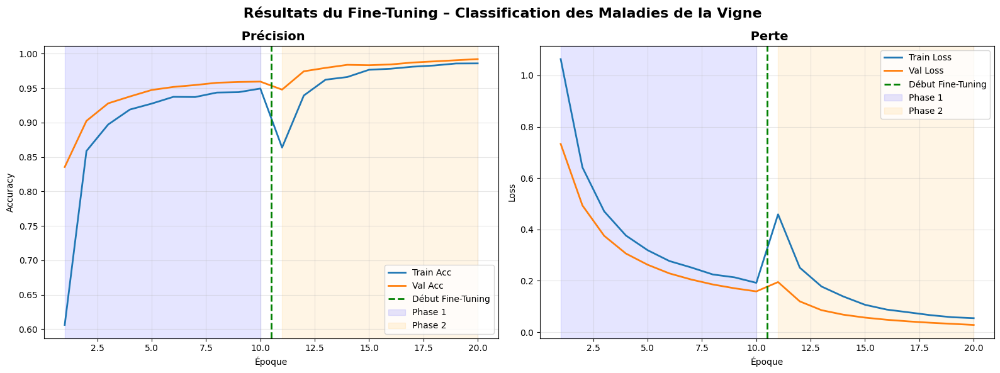


 Statistiques finales :
   • Train Acc final  : 0.9860
   • Val   Acc final  : 0.9922
   • Train Loss final : 0.0544
   • Val   Loss final : 0.0280

 Gain Val Acc phase 2 : 0.9596 → 0.9922 (+3.27 %)


In [ ]:
#  Affichage des courbes de performance
print(" Visualisation des résultats d'entraînement :")

plot_training_history(
    history_initial,      # Phase 1 (Transfer Learning)
    history_finetune,     # Phase 2 (Fine-Tuning)
    " Résultats du Fine-Tuning – Classification des Maladies de la Vigne"
)



#### Analyse des résultats

In [ ]:
#  Analyse automatique des résultats
def analyze_training_results(history1, history2=None):
    """
    Analyse automatique des résultats d'entraînement pour la classification
    des maladies de la vigne.
    Args:
        history1: Historique de la Phase 1 (Transfer Learning)
        history2: Historique de la Phase 2 (Fine-Tuning), optionnel
    """
    print(" === ANALYSE DES RÉSULTATS D'ENTRAÎNEMENT ===")
    
    # Récupération des dernières valeurs
    val_acc1 = history1.history['val_accuracy'][-1]
    train_acc1 = history1.history['accuracy'][-1]
    val_loss1 = history1.history['val_loss'][-1]
    train_loss1 = history1.history['loss'][-1]
    
    if history2:
        val_acc2 = history2.history['val_accuracy'][-1]
        train_acc2 = history2.history['accuracy'][-1]
        val_loss2 = history2.history['val_loss'][-1]
        train_loss2 = history2.history['loss'][-1]
        improvement = val_acc2 - val_acc1
        
        print(f"\n Comparaison des phases :")
        print(f"   • Phase 1 (head-only)   : Acc val = {val_acc1:.4f}, Loss val = {val_loss1:.4f}")
        print(f"   • Phase 2 (fine-tuning): Acc val = {val_acc2:.4f}, Loss val = {val_loss2:.4f}")
        print(f"   • Gain de val_accuracy : +{improvement*100:.2f} %")
        
        # Qualifier l'amélioration
        if improvement > 0.02:
            print("    Excellent ! Le fine-tuning a significativement amélioré les performances.")
        elif improvement > 0.01:
            print("    Bien ! Amélioration notable grâce au fine-tuning.")
        elif improvement > 0:
            print("    Légère amélioration grâce au fine-tuning.")
        else:
            print("    Pas d'amélioration après fine-tuning (vérifier overfitting).")
        
        # Analyse de l'écart train vs val après phase 2
        gap = train_acc2 - val_acc2
        print(f"\n Surapprentissage Phase 2 :")
        print(f"   • Train Acc = {train_acc2:.4f}, Val Acc = {val_acc2:.4f}")
    else:
        # Sans fine-tuning, on analyse la seule phase 1
        gap = train_acc1 - val_acc1
        print(f"\n Surapprentissage Phase 1 :")
        print(f"   • Train Acc = {train_acc1:.4f}, Val Acc = {val_acc1:.4f}")
    
    print(f"   • Écart Train vs Val   = {gap*100:.2f} %")
    if gap < 0.05:
        print("    Équilibre excellent, surapprentissage minimal.")
    elif gap < 0.10:
        print("    Bon équilibre, surapprentissage acceptable.")
    else:
        print("    Surapprentissage important, envisager plus de régularisation.")
    
    # Recommandations générales
    print(f"\n Recommandations :")
    if history2 and improvement < 0.005:
        print("   • Tester un plus grand nombre de couches dégelées ou augmenter les augmentations.")
    if gap > 0.10:
        print("   • Augmenter le dropout ou ajouter des augmentations de données.")
    if (history2 and val_acc2 > 0.95) or (not history2 and val_acc1 > 0.95):
        print("   • Excellents résultats ! Envisager un test sur un jeu externe.")
    print()

# Lancement de l'analyse
analyze_training_results(history_initial, history_finetune)


 === ANALYSE DES RÉSULTATS D'ENTRAÎNEMENT ===

 Comparaison des phases :
   • Phase 1 (head-only)   : Acc val = 0.9596, Loss val = 0.1587
   • Phase 2 (fine-tuning): Acc val = 0.9922, Loss val = 0.0280
   • Gain de val_accuracy : +3.27 %
    Excellent ! Le fine-tuning a significativement amélioré les performances.

 Surapprentissage Phase 2 :
   • Train Acc = 0.9860, Val Acc = 0.9922
   • Écart Train vs Val   = -0.62 %
    Équilibre excellent, surapprentissage minimal.

 Recommandations :
   • Excellents résultats ! Envisager un test sur un jeu externe.



#### Métriques Détaillées par Epochs

In [ ]:
# Tableau détaillé des métriques
import pandas as pd

def create_metrics_table(history1, history2=None):
    """
    Crée un DataFrame détaillé des métriques par époque pour vos deux phases.
    """
    # Phase 1
    n1 = len(history1.history['accuracy'])
    epochs = list(range(1, n1 + 1))
    phases = ['Transfer Learning'] * n1
    train_acc = history1.history['accuracy'].copy()
    val_acc   = history1.history['val_accuracy'].copy()
    train_loss= history1.history['loss'].copy()
    val_loss  = history1.history['val_loss'].copy()
    
    # Phase 2 (optionnelle)
    if history2:
        n2 = len(history2.history['accuracy'])
        epochs += list(range(n1 + 1, n1 + n2 + 1))
        phases += ['Fine-Tuning'] * n2
        train_acc += history2.history['accuracy']
        val_acc   += history2.history['val_accuracy']
        train_loss+= history2.history['loss']
        val_loss  += history2.history['val_loss']
    
    # Construire le DataFrame
    df = pd.DataFrame({
        'Époque'           : epochs,
        'Phase'            : phases,
        'Précision Train'  : train_acc,
        'Précision Val'    : val_acc,
        'Perte Train'      : train_loss,
        'Perte Val'        : val_loss,
    })
    # Calcul de l'écart train/val
    df['Écart Précision'] = df['Précision Train'] - df['Précision Val']
    
    return df

# Génération et affichage
print(" == Tableau détaillé des métriques :")
metrics_df = create_metrics_table(history_initial, history_finetune)
print(metrics_df.to_string(index=False))

#  Statistiques résumées
phase1_df = metrics_df[metrics_df['Phase'] == 'Transfer Learning']
phase2_df = metrics_df[metrics_df['Phase'] == 'Fine-Tuning']

if not phase2_df.empty:
    best1 = phase1_df['Précision Val'].max()
    best2 = phase2_df['Précision Val'].max()
    improvement = best2 - best1
    print("\n == Statistiques résumées :")
    print(f"   • Phase 1 – Meilleure précision validation : {best1:.4f}")
    print(f"   • Phase 2 – Meilleure précision validation : {best2:.4f}")
    print(f"   • Amélioration totale : +{improvement*100:.2f} %")
else:
    print("\n == Statistiques résumées :")
    print(f"   • Meilleure précision validation : {phase1_df['Précision Val'].max():.4f}")


 == Tableau détaillé des métriques :
 Époque             Phase  Précision Train  Précision Val  Perte Train  Perte Val  Écart Précision
      1 Transfer Learning         0.606065       0.835457     1.063661   0.733163        -0.229392
      2 Transfer Learning         0.858765       0.902493     0.641857   0.493450        -0.043728
      3 Transfer Learning         0.897258       0.927978     0.470536   0.375225        -0.030719
      4 Transfer Learning         0.918998       0.937950     0.376354   0.306175        -0.018953
      5 Transfer Learning         0.927582       0.947368     0.319166   0.262539        -0.019786
      6 Transfer Learning         0.937413       0.951801     0.277011   0.228831        -0.014387
      7 Transfer Learning         0.937137       0.954571     0.252031   0.205130        -0.017434
      8 Transfer Learning         0.943644       0.957895     0.224628   0.185669        -0.014250
      9 Transfer Learning         0.944198       0.959003     0.213397  

#### Évaluation et Prédictions du Modèle

In [62]:
#  Évaluation finale du modèle et prédictions
print(" === ÉVALUATION FINALE DU MODÈLE ===")
print("\n === Évaluation sur le dataset de validation...")

# 1️ Évaluation brute
test_loss, test_acc = model.evaluate(ds_val_processed, verbose=1)
print(f"\n Résultats finaux :")
print(f"    Perte finale      : {test_loss:.4f}")
print(f"    Précision finale  : {test_acc:.4f} ({test_acc*100:.2f}%)")

# 2️ Interprétation sommaire
if test_acc >= 0.95:
    print("    Excellente performance ! Modèle prêt pour la production")
elif test_acc >= 0.90:
    print("    Très bonne performance ! Résultats impressionnants")
elif test_acc >= 0.80:
    print("    Bonne performance, utilisable dans la plupart des cas")
elif test_acc >= 0.70:
    print("    Performance correcte, peut être améliorée")
else:
    print("    Performance à améliorer, réviser l'approche")


 === ÉVALUATION FINALE DU MODÈLE ===

 === Évaluation sur le dataset de validation...
57/57 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.9878 - loss: 0.0391

 Résultats finaux :
    Perte finale      : 0.0280
    Précision finale  : 0.9922 (99.22%)
    Excellente performance ! Modèle prêt pour la production


#### Analyse et prédiction

 Prédictions sur le dataset de validation :


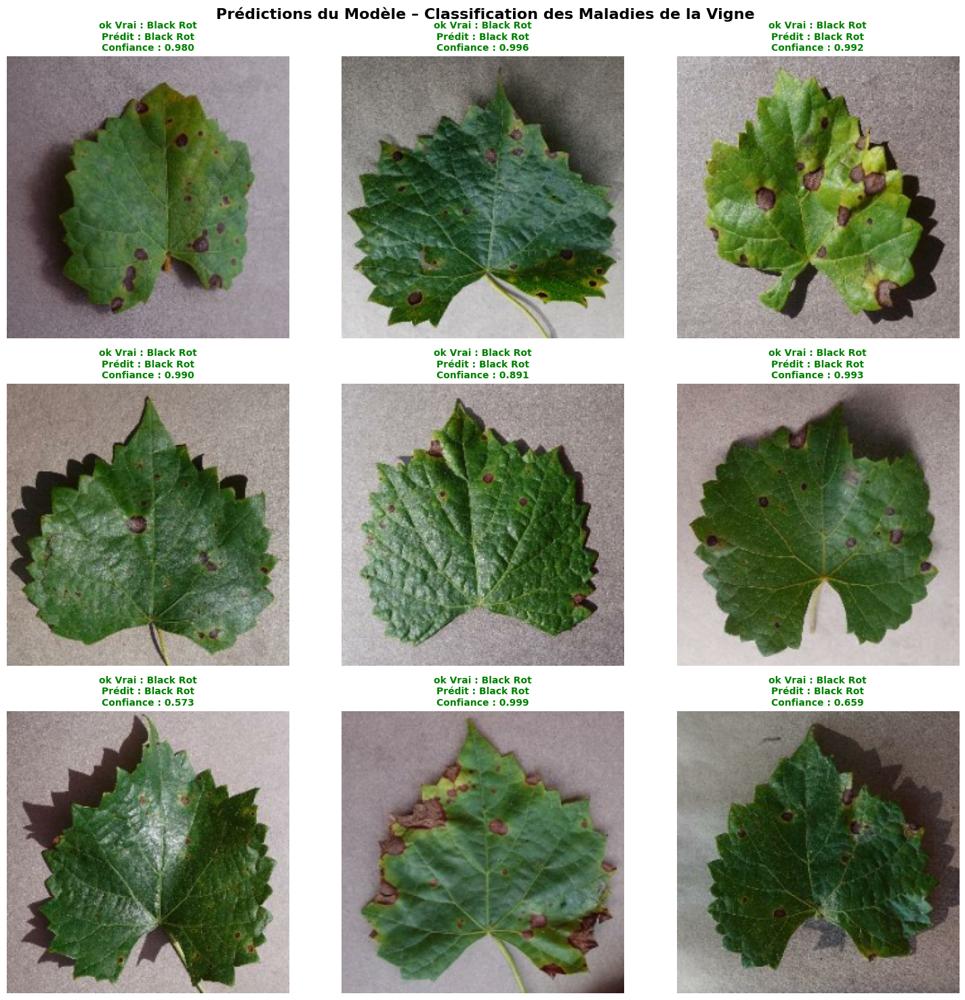


 Statistiques sur ce batch :
    Prédictions correctes : 9/9 (100.0%)
    Confiance moyenne     : 0.897 (89.7%)
    Confiance min / max   : 0.573 / 0.999

 Interprétation :
    Titre en VERT  : prédiction correcte
    Titre en ROUGE : prédiction incorrecte
    Confiance ∈ [0,1] : certitude du modèle
    Confiance > 0.8 : très fiable


In [63]:
# 🔍 Prédictions sur le dataset de validation – affichage sans clipping
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def predict_and_show_raw(ds_val_raw, model, class_names,
                         num_images=9, figsize=(15,15)):
    """
    Affiche des prédictions du modèle sur des images brutes
    et gère labels scalaires ou one-hot.
    Args:
      ds_val_raw  : tf.data.Dataset retournant (image, label) non batché
      model       : modèle entraîné
      class_names : liste des noms de classes
      num_images  : nb d’images à afficher (max 9)
      figsize     : taille de la figure
    """
    plt.figure(figsize=figsize)
    plt.suptitle(" Prédictions du Modèle – Classification des Maladies de la Vigne",
                 fontsize=16, fontweight='bold')

    correct = 0
    confidences = []
    total = 0

    # Itérer sur les premiers exemples
    for raw_img, raw_lbl in ds_val_raw.take(num_images):
        total += 1
        ax = plt.subplot(3, 3, total)

        # Affichage de l'image brute (uint8 0–255 → float 0–1)
        img_np = raw_img.numpy()
        plt.imshow(img_np.astype('float32') / 255.0)
        plt.axis('off')

        # Préprocessing pour EfficientNetB0
        resized     = tf.image.resize(img_np, (IMG_SIZE, IMG_SIZE))
        proc        = tf.keras.applications.efficientnet.preprocess_input(resized)
        proc_batch  = tf.expand_dims(proc, axis=0)

        # Prédiction
        preds       = model.predict(proc_batch, verbose=0)[0]
        pred_idx    = int(np.argmax(preds))
        confidence  = float(preds[pred_idx])
        confidences.append(confidence)

        # Extraction du label vrai, qu’il soit one-hot ou scalaire
        lbl_np = raw_lbl.numpy()
        if isinstance(lbl_np, np.ndarray) and lbl_np.ndim > 0:
            true_idx = int(np.argmax(lbl_np))
        else:
            true_idx = int(lbl_np)

        # Statistique de justesse
        is_correct = (pred_idx == true_idx)
        if is_correct:
            correct += 1

        # Titre coloré
        icon  = 'ok' if is_correct else 'ko'
        color = 'green' if is_correct else 'red'
        title = (f"{icon} Vrai : {class_names[true_idx]}\n"
                 f"Prédit : {class_names[pred_idx]}\n"
                 f"Confiance : {confidence:.3f}")
        plt.title(title, fontsize=10, color=color, fontweight='bold')

        if total >= num_images:
            break

    plt.tight_layout()
    plt.show()

    # Statistiques du batch affiché
    accuracy = correct / total if total else 0.0
    avg_conf  = float(np.mean(confidences)) if confidences else 0.0
    print("\n Statistiques sur ce batch :")
    print(f"    Prédictions correctes : {correct}/{total} ({accuracy*100:.1f}%)")
    print(f"    Confiance moyenne     : {avg_conf:.3f} ({avg_conf*100:.1f}%)")
    print(f"    Confiance min / max   : {min(confidences):.3f} / {max(confidences):.3f}")

    return correct, total, confidences

#  Appel de la fonction
print(" Prédictions sur le dataset de validation :")
correct, total, confidences = predict_and_show_raw(ds_val, model, class_names)

print("\n Interprétation :")
print("    Titre en VERT  : prédiction correcte")
print("    Titre en ROUGE : prédiction incorrecte")
print("    Confiance ∈ [0,1] : certitude du modèle")
print("    Confiance > 0.8 : très fiable")


#### Matrice de confusion

 Création de la matrice de confusion…


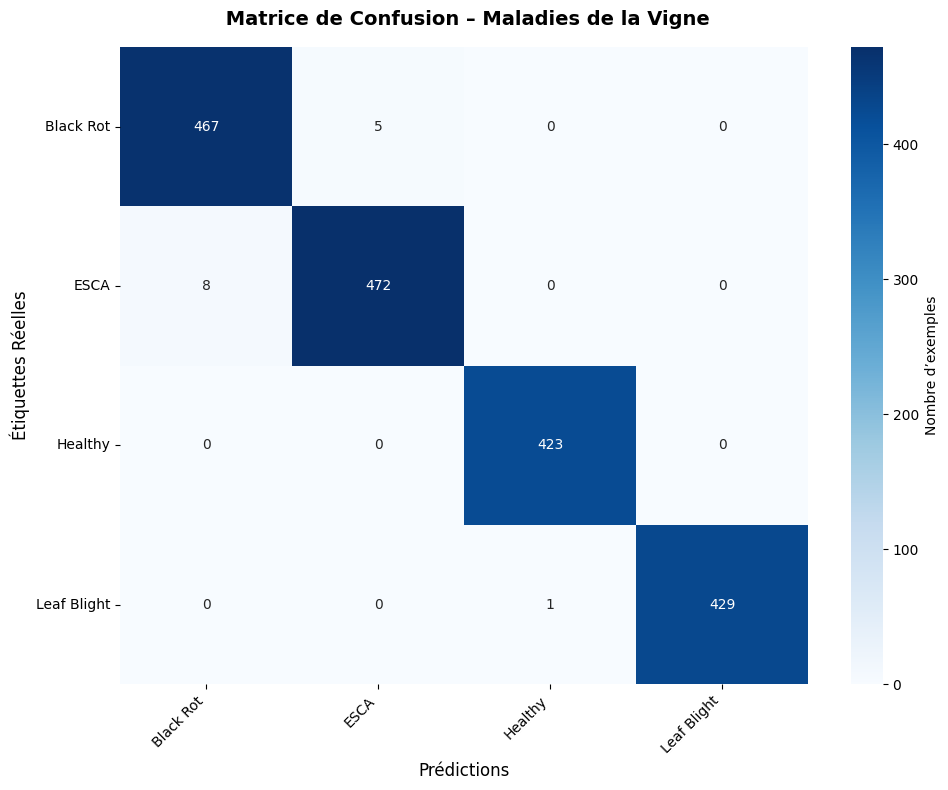


 Précision par classe :
   • Black Rot   : 467/472 → 98.9%
   • ESCA        : 472/480 → 98.3%
   • Healthy     : 423/423 → 100.0%
   • Leaf Blight : 429/430 → 99.8%

 Confusions significatives (>10%) :

 === Rapport de classification détaillé :
              precision    recall  f1-score   support

   Black Rot     0.9832    0.9894    0.9863       472
        ESCA     0.9895    0.9833    0.9864       480
     Healthy     0.9976    1.0000    0.9988       423
 Leaf Blight     1.0000    0.9977    0.9988       430

    accuracy                         0.9922      1805
   macro avg     0.9926    0.9926    0.9926      1805
weighted avg     0.9923    0.9922    0.9922      1805



In [64]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def create_confusion_matrix(ds_val_processed, model, class_names):
    """
    Crée et affiche la matrice de confusion pour
    la classification des maladies de la vigne, en s'assurant
    que tous les labels sont des scalaires d'indices.
    """
    print(" Création de la matrice de confusion…")
    
    all_preds = []
    all_trues = []
    
    # Parcours complet du dataset de validation traité
    for images, labels in ds_val_processed:
        # 1️ Prédictions
        probs = model.predict(images, verbose=0)
        preds = np.argmax(probs, axis=1)              # int array
        
        # 2️ Conversion des labels en indices
        lbls = labels.numpy()
        if lbls.ndim == 2:
            # one-hot → argmax
            trues = np.argmax(lbls, axis=1)
        else:
            # déjà int scalaires
            trues = lbls.astype(int)
        
        # 3️ Accumulation
        all_preds.extend(preds.tolist())
        all_trues.extend(trues.tolist())
    
    # 4 Construction de la matrice
    cm = confusion_matrix(all_trues, all_preds)
    
    # 5️ Affichage
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names,
        cbar_kws={'label': 'Nombre d’exemples'}
    )
    plt.title(
        " Matrice de Confusion – Maladies de la Vigne",
        fontsize=14, fontweight='bold', pad=16
    )
    plt.xlabel("Prédictions", fontsize=12)
    plt.ylabel("Étiquettes Réelles", fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # 6️ Analyse par classe
    print("\n Précision par classe :")
    for i, name in enumerate(class_names):
        tp = cm[i, i]
        total_i = cm[i].sum()
        acc_i = tp / total_i if total_i > 0 else 0.0
        print(f"   • {name:12s}: {tp}/{total_i} → {acc_i*100:.1f}%")
    
    # 7️ Confusions significatives
    print("\n Confusions significatives (>10%) :")
    for i, name_i in enumerate(class_names):
        row_sum = cm[i].sum()
        if row_sum == 0:
            continue
        for j, name_j in enumerate(class_names):
            if i != j:
                rate = cm[i, j] / row_sum * 100
                if rate > 10:
                    print(f"   {name_i} → {name_j}: {cm[i, j]} cas ({rate:.1f}%)")
    
    # 8️ Rapport détaillé
    print("\n === Rapport de classification détaillé :")
    print(classification_report(
        all_trues, all_preds,
        target_names=class_names,
        digits=4
    ))
    
    return cm

# Usage
conf_matrix = create_confusion_matrix(ds_val_processed, model, class_names)


#### Analyse des erreurs

 Analyse des erreurs de classification…


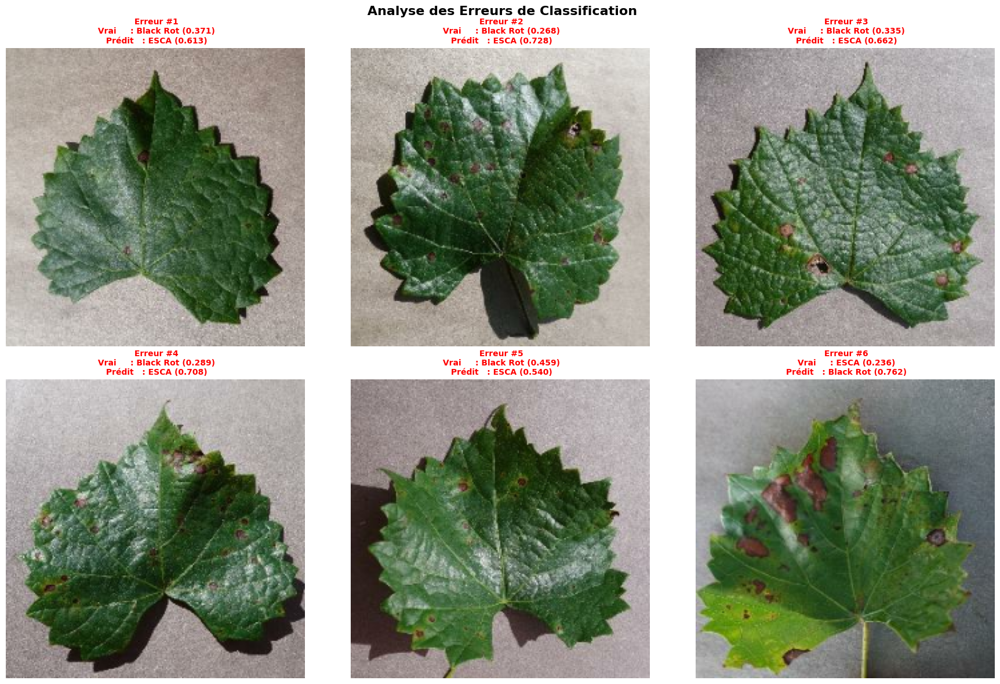


 Analyse de 6 erreurs :
   • Confiance (prédiction erronée) : 0.669
   • Confiance (vraie classe)       : 0.327
   • Écart de confiance            : 0.342

 Types d’erreurs fréquents :
   • Black Rot → ESCA: 5 cas
   • ESCA → Black Rot: 1 cas

 Conseils pour améliorer le modèle :
    Étudier ces erreurs pour repérer les motifs d’échec
    Renforcer les classes souvent confondues avec plus d’images ou d’augmentations
    Expérimenter des augmentations ciblées ou un modèle plus profond pour ces cas-ci


In [65]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def analyze_errors_raw(ds_val_raw, model, class_names, 
                       max_errors=6, img_size=IMG_SIZE):
    """
    Analyse et affiche les premières erreurs de classification
    en partant du dataset brut (images uint8 0–255).
    
    Args:
      ds_val_raw   : tf.data.Dataset retournant (image, label) non batché
      model        : modèle entraîné
      class_names  : liste des noms de classes
      max_errors   : nombre max d’erreurs à afficher
      img_size     : taille d’entrée pour le modèle (e.g. 224)
    """
    print(" Analyse des erreurs de classification…")
    errors = []
    
    # 1) Parcours du dataset brut à la recherche d’erreurs
    for raw_img, raw_lbl in ds_val_raw:
        # Préprocessing pour la prédiction
        # – redimensionne
        img_resized = tf.image.resize(raw_img, (img_size, img_size))
        # – normalise pour EfficientNetB0
        img_norm    = tf.keras.applications.efficientnet.preprocess_input(img_resized)
        # Passage au modèle
        preds       = model.predict(tf.expand_dims(img_norm, 0), verbose=0)[0]
        pred_idx    = int(np.argmax(preds))
        
        # Récupération du label vrai
        lbl_np = raw_lbl.numpy()
        if isinstance(lbl_np, np.ndarray) and lbl_np.ndim > 0:
            true_idx = int(np.argmax(lbl_np))
        else:
            true_idx = int(lbl_np)
        
        # Si erreur, on stocke l’exemple
        if pred_idx != true_idx:
            errors.append({
                'raw_image'      : raw_img.numpy(),
                'true_label'     : true_idx,
                'pred_label'     : pred_idx,
                'confidence'     : float(preds[pred_idx]),
                'true_confidence': float(preds[true_idx])
            })
        if len(errors) >= max_errors:
            break
    
    if not errors:
        print(" Aucune erreur détectée dans ces premiers exemples.")
        return errors
    
    # 2) Affichage des erreurs (raw uint8 → [0,1] pour imshow)
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(" Analyse des Erreurs de Classification", fontsize=16, fontweight='bold')
    
    for idx, err in enumerate(errors):
        row, col = divmod(idx, 3)
        ax = axes[row, col]
        
        # Image brute en uint8 → float [0,1]
        img_disp = err['raw_image'].astype('float32') / 255.0
        ax.imshow(img_disp)
        ax.axis('off')
        
        # Titre détaillé
        tn = class_names[err['true_label']]
        pn = class_names[err['pred_label']]
        tc = err['true_confidence']
        pc = err['confidence']
        title = (
            f" Erreur #{idx+1}\n"
            f" Vrai     : {tn} ({tc:.3f})\n"
            f" Prédit   : {pn} ({pc:.3f})"
        )
        ax.set_title(title, fontsize=10, color='red', fontweight='bold')
    
    # Cacher les sous-graphes vides
    for idx in range(len(errors), 6):
        r, c = divmod(idx, 3)
        axes[r, c].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 3) Stats et typologie
    conf_err  = np.mean([e['confidence']      for e in errors])
    conf_true = np.mean([e['true_confidence'] for e in errors])
    print(f"\n Analyse de {len(errors)} erreurs :")
    print(f"   • Confiance (prédiction erronée) : {conf_err:.3f}")
    print(f"   • Confiance (vraie classe)       : {conf_true:.3f}")
    print(f"   • Écart de confiance            : {(conf_err-conf_true):.3f}")
    
    # Comptage des types d’erreurs
    err_types = {}
    for e in errors:
        key = f"{class_names[e['true_label']]} → {class_names[e['pred_label']]}"
        err_types[key] = err_types.get(key, 0) + 1
    print("\n Types d’erreurs fréquents :")
    for typ, cnt in sorted(err_types.items(), key=lambda x: x[1], reverse=True):
        print(f"   • {typ}: {cnt} cas")
    
    return errors

#  Lancer l’analyse sur le dataset brut (non prétraité)
errors = analyze_errors_raw(ds_val, model, class_names)

print("\n Conseils pour améliorer le modèle :")
print("    Étudier ces erreurs pour repérer les motifs d’échec")
print("    Renforcer les classes souvent confondues avec plus d’images ou d’augmentations")
print("    Expérimenter des augmentations ciblées ou un modèle plus profond pour ces cas-ci")
